# Advanced Lane Finding Project
## The goals / steps of this project are the following:

- Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
- Apply a distortion correction to raw images.
- Use color transforms, gradients, etc., to create a thresholded binary image.
- Apply a perspective transform to rectify binary image ("birds-eye view").
- Detect lane pixels and fit to find the lane boundary.
- Determine the curvature of the lane and vehicle position with respect to center.
- Warp the detected lane boundaries back onto the original image.
- Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

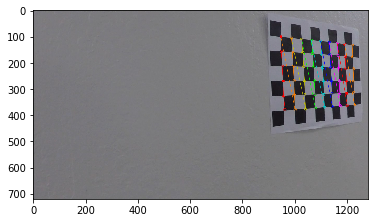

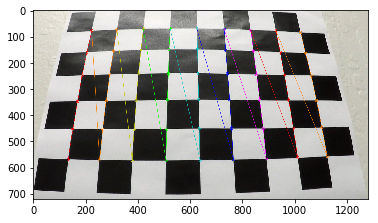

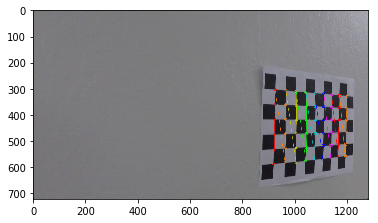

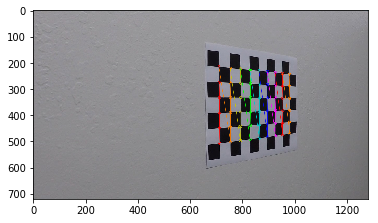

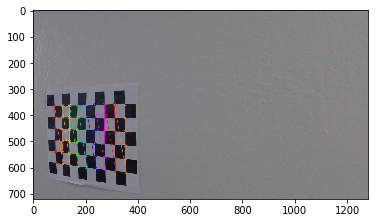

...

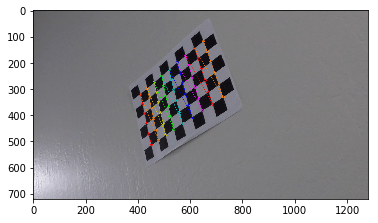

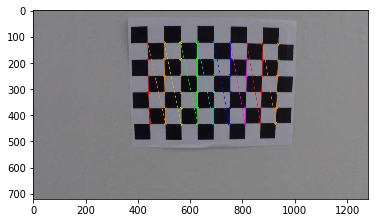

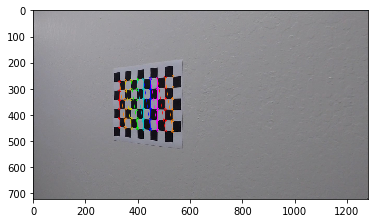

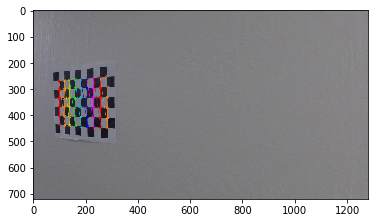

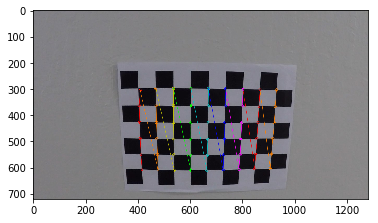

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

nx = 9
ny = 6

objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)

    # Grayscale the image
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (ny,nx),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (ny,nx), corners, ret)
        img = img[...,::-1]  # RGB -> BGR
        plt.figure()
        plt.imshow(img)
        
        # Camera calibration, given object points, image points, and the shape of the grayscale image
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

In [2]:
# Undistorting a test image
def undistor(image): 
    dst = cv2.undistort(image, mtx, dist, None, mtx)
    return dst

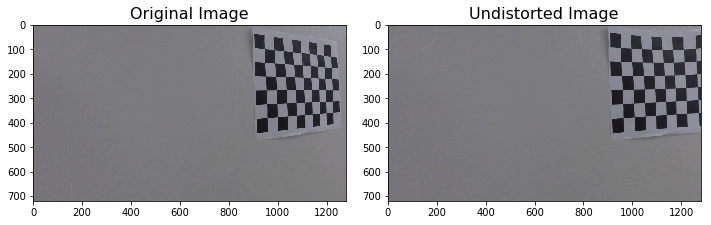

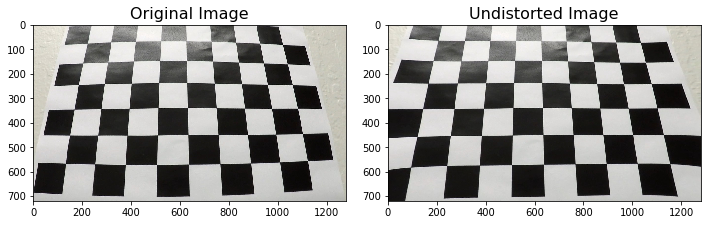

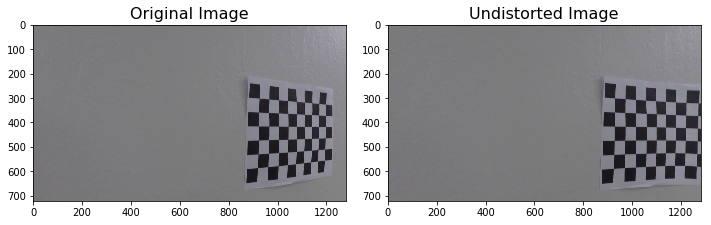

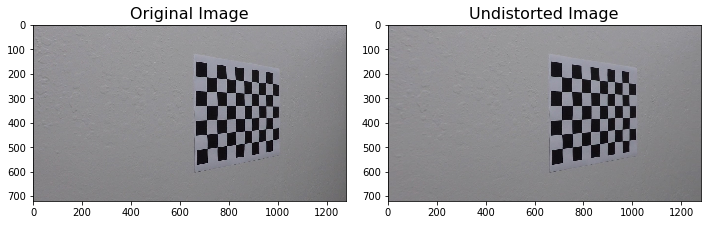

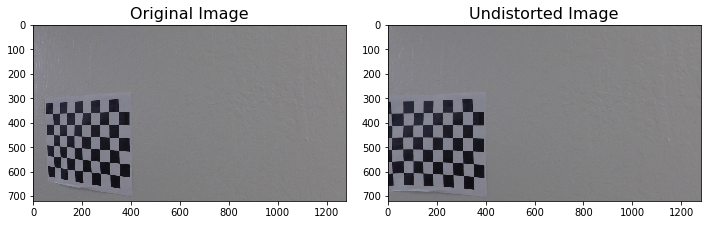

...

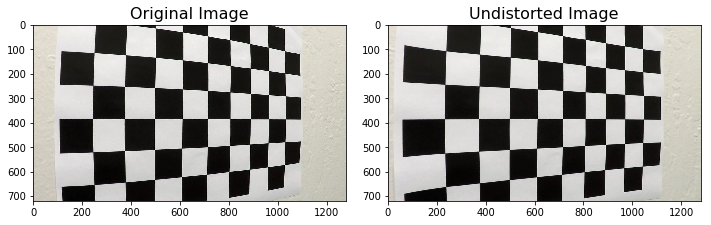

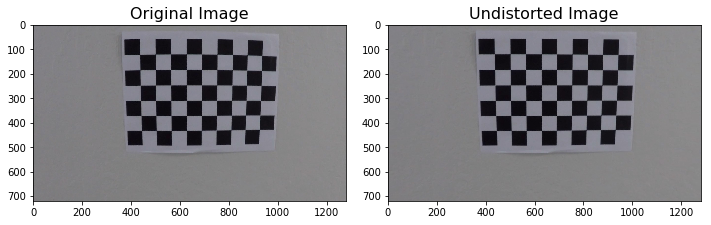

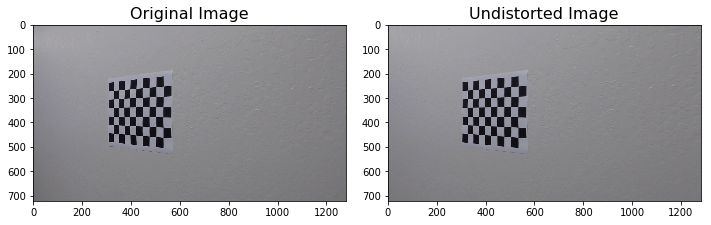

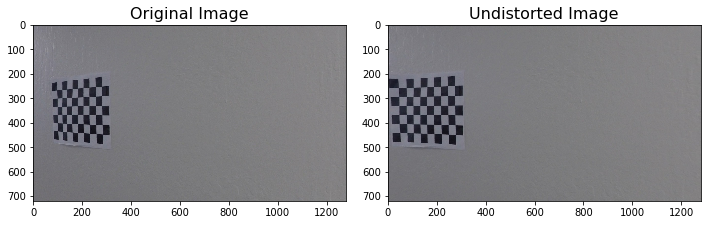

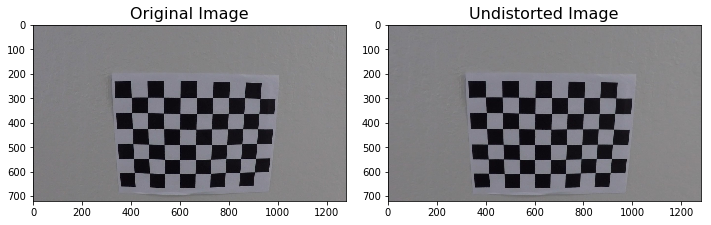

In [3]:
calibration_images = glob.glob('./camera_cal/calibration*.jpg')

# Plot the result
for i in range(len(calibration_images)):
    image_file = calibration_images[i]
    image = cv2.imread(image_file)
    # RGB -> BGR
    image = image[...,::-1]
    unsdistorted_image = undistor(image)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
    f.tight_layout()
    ax1.set_title("Original Image", fontsize=16)
    ax1.imshow(image)
    ax2.set_title("Undistorted Image", fontsize=16)
    ax2.imshow(unsdistorted_image)
    file_name = "output_images/calibration" + str(i + 1) + ".png"
    f.savefig(file_name)

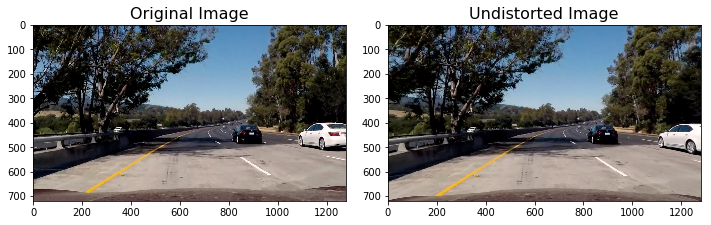

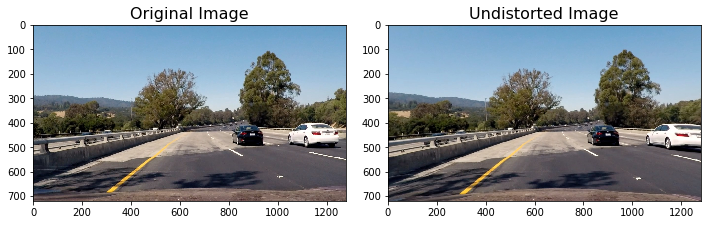

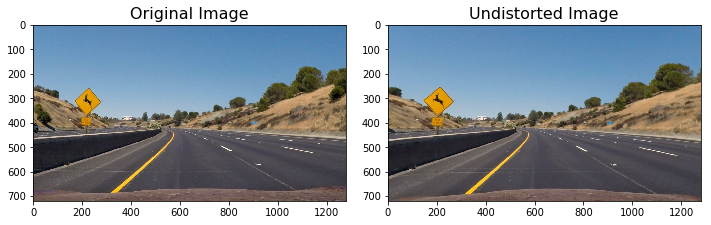

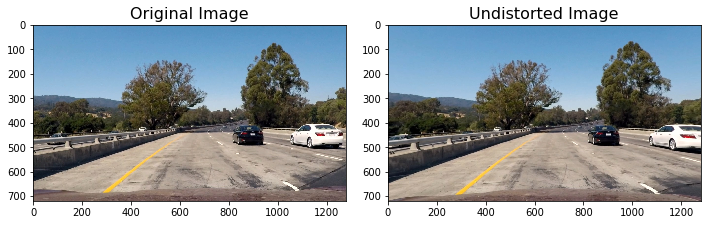

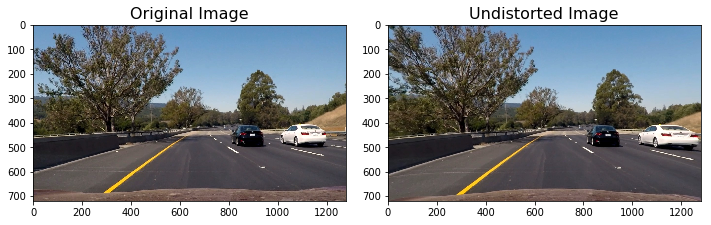

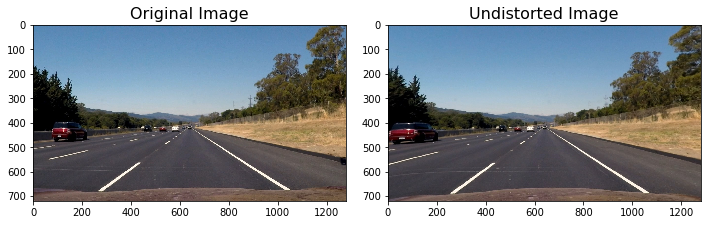

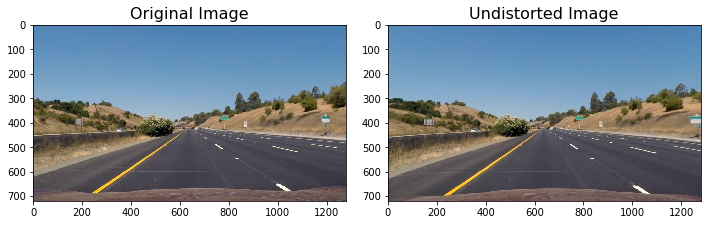

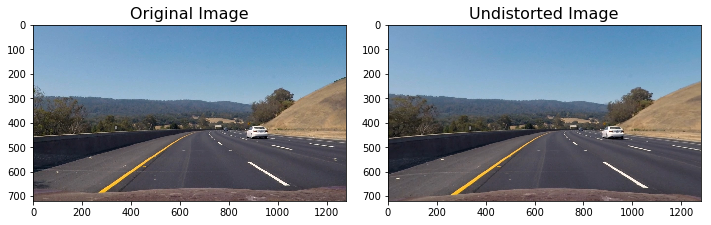

In [4]:
test_images = []
unsdistorted_images = []

test_images_files = glob.glob('./test_images/*.jpg')

# Plot the result
for image_file in test_images_files:
    image = cv2.imread(image_file)
    # RGB -> BGR
    image = image[...,::-1]
    test_images.append(image)
    unsdistorted_image = undistor(image)
    unsdistorted_images.append(unsdistorted_image)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
    f.tight_layout()
    ax1.set_title("Original Image", fontsize=16)
    ax1.imshow(image)
    ax2.set_title("Undistorted Image", fontsize=16)
    ax2.imshow(unsdistorted_image)

In [5]:
# Convert to image to binary
def toBinary(image, r_thresh=(210, 255), s_thresh=(120, 255), sx_thresh=(20, 100)):
    image = np.copy(image)

    R = image[:,:,0]
    r_binary = np.zeros_like(R)
    r_binary[(R > r_thresh[0]) & (R <= r_thresh[1])] = 1 
    
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, r_binary))
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(r_binary == 1) | (sxbinary == 1)] = 1   
    return combined_binary

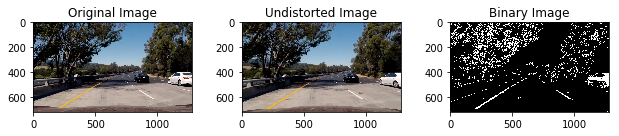

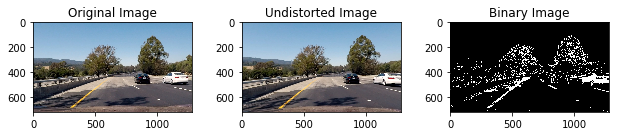

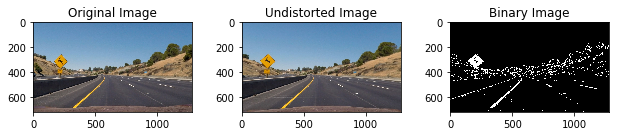

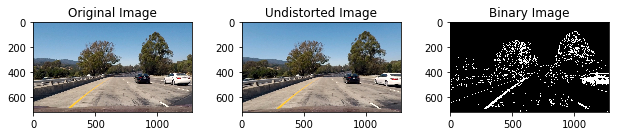

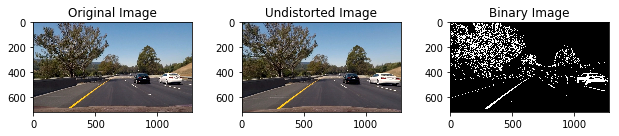

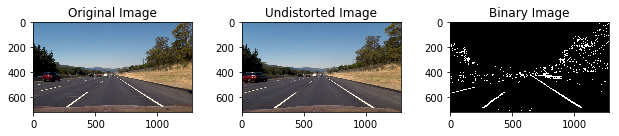

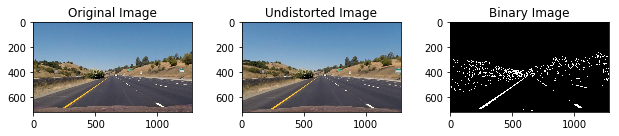

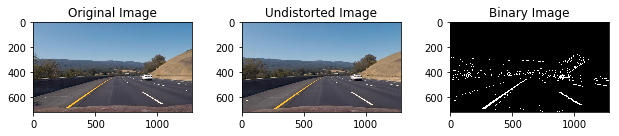

In [6]:
binary_images = []

for unsdistorted_image in unsdistorted_images:
    binary_image = toBinary(unsdistorted_image)
    binary_images.append(binary_image)

# Plot the result
for i in range(len(binary_images)):
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(8,4))
    f.tight_layout()
    ax1.imshow(test_images[i])
    ax1.set_title('Original Image', fontsize=12)
    ax2.imshow(unsdistorted_images[i], cmap='gray')
    ax2.set_title('Undistorted Image', fontsize=12)
    ax3.imshow(binary_images[i], cmap='gray')
    ax3.set_title('Binary Image', fontsize=12)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)    

In [7]:
def warper(image):
    img_size = (image.shape[1], image.shape[0])
    
    offset = 350 # offset for dst points
        
    # Source points
    src = np.float32([[[ 610,  450]], 
                      [[ 680,  450]], 
                      [[ img_size[0]-300,  680]],
                      [[ 380,  680]]])

    # Result points        
    dst = np.float32([[offset, 0], 
                    [img_size[0]-offset, 0], 
                    [img_size[0]-offset, img_size[1]], 
                    [offset, img_size[1]]])
    
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(image, M, img_size)
    
    # Return the resulting image and matrix
    return warped, M

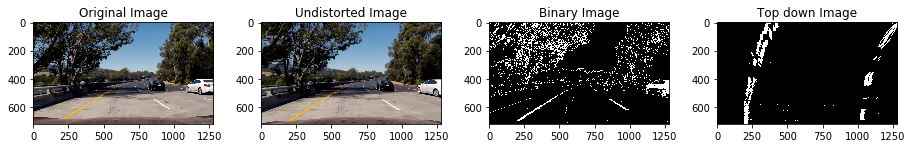

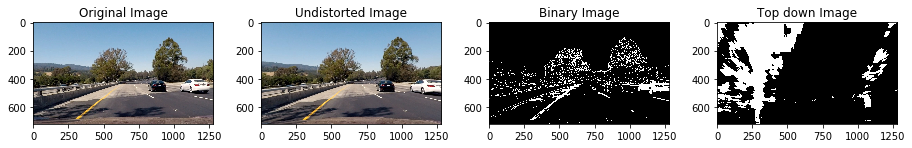

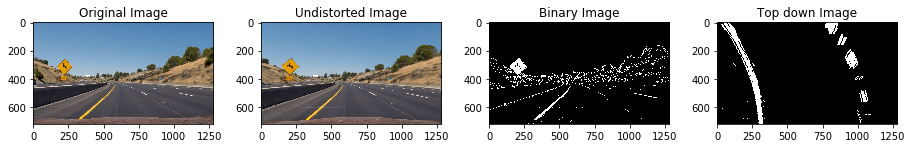

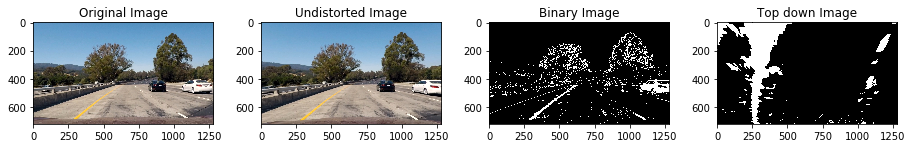

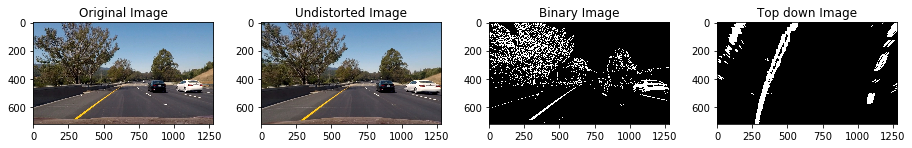

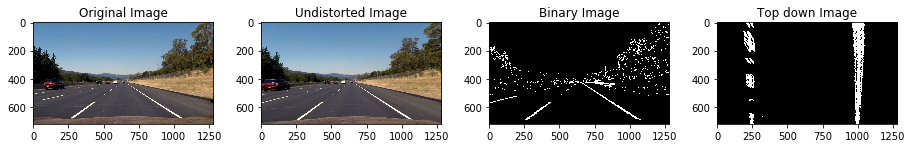

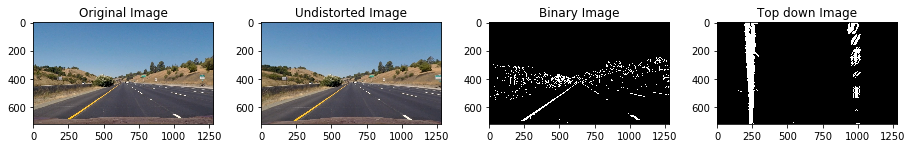

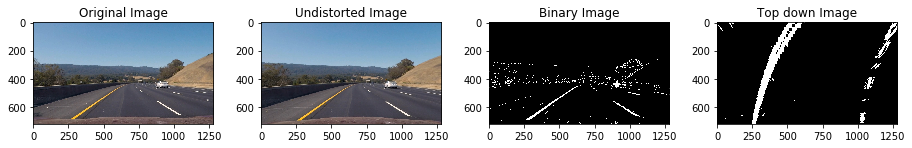

In [8]:
warped_images = []
perspective_Ms = []

for binary_image in binary_images:
    warped_image, perspective_M = warper(binary_image)
    warped_images.append(warped_image)
    perspective_Ms.append(perspective_M)
    
# Plot the result
for i in range(len(warped_images)):
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(12,6))
    f.tight_layout()
    ax1.imshow(test_images[i])
    ax1.set_title('Original Image', fontsize=12)
    ax2.imshow(unsdistorted_images[i], cmap='gray')
    ax2.set_title('Undistorted Image', fontsize=12)
    ax3.imshow(binary_images[i], cmap='gray')
    ax3.set_title('Binary Image', fontsize=12)
    ax4.imshow(warped_images[i], cmap='gray')
    ax4.set_title('Top down Image', fontsize=12)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)    

In [9]:
# window settings
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    leftx = []
    rightx = []
    
    window = np.ones(window_width) # Create our window template that we will use for convolutions   
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(image[int(3*image.shape[0]/4):,:int(image.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(image[int(3*image.shape[0]/4):,int(image.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(image.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))  
    leftx.append(l_center)
    rightx.append(r_center)
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(image.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(image[int(image.shape[0]-(level+1)*window_height):int(image.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,image.shape[1]))
        prev_l_center = l_center        
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset      
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,image.shape[1]))
        prev_r_center = r_center
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))
        leftx.append(l_center)
        rightx.append(r_center)

    return window_centroids, leftx, rightx

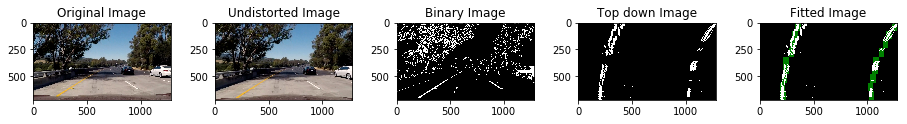

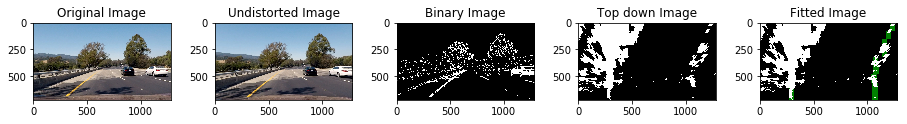

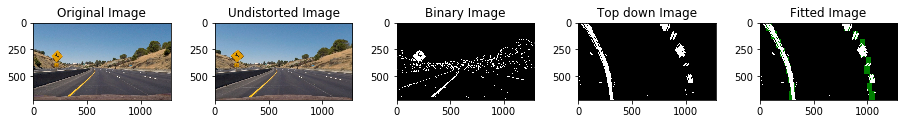

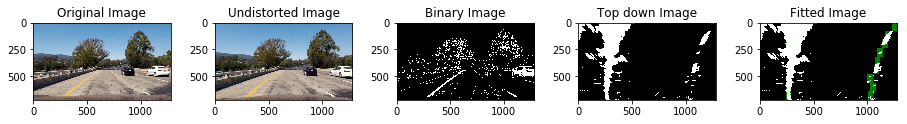

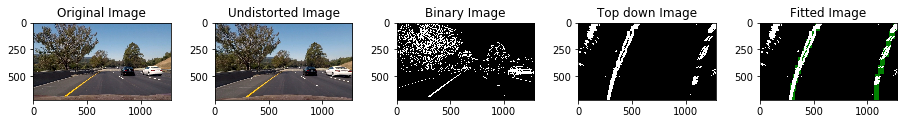

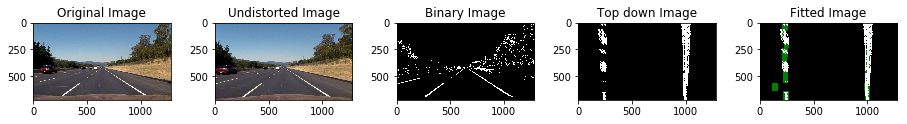

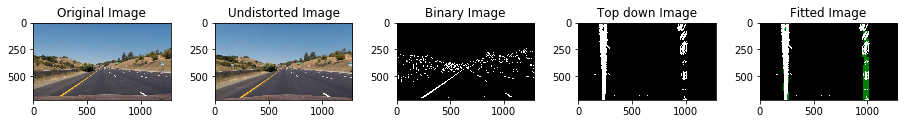

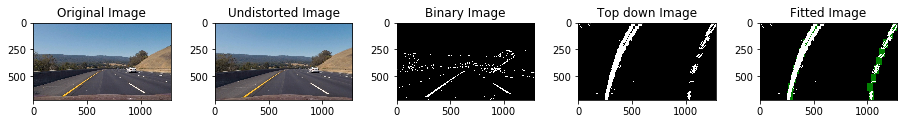

In [10]:
outputs = []
leftxs = []
rightxs = []
for warped_image in warped_images:
    window_centroids, leftx, rightx = find_window_centroids(warped_image, window_width, window_height, margin)
    leftxs.append(leftx)
    rightxs.append(rightx)
    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped_image)
        r_points = np.zeros_like(warped_image)

        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped_image,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped_image,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
    
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        out_img = np.dstack((warped_image, warped_image, warped_image))*255
        warpage = np.array(out_img,np.uint8) # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results
    
    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    outputs.append(output)
    

# Plot the result
for i in range(len(outputs)):
    f, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(12,6))
    f.tight_layout()
    ax1.imshow(test_images[i])
    ax1.set_title('Original Image', fontsize=12)
    ax2.imshow(unsdistorted_images[i], cmap='gray')
    ax2.set_title('Undistorted Image', fontsize=12)
    ax3.imshow(binary_images[i], cmap='gray')
    ax3.set_title('Binary Image', fontsize=12)
    ax4.imshow(warped_images[i], cmap='gray')
    ax4.set_title('Top down Image', fontsize=12)
    ax5.imshow(outputs[i], cmap='gray')
    ax5.set_title('Fitted Image', fontsize=12)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)    


In [11]:
# to cover same y-range as image
ploty = np.linspace(0, 719, num=9)

def curvature(leftx, rightx):
    leftx = np.asarray(leftx[::-1])  # Reverse to match top-to-bottom in y
    rightx = np.asarray(rightx[::-1])  # Reverse to match top-to-bottom in y
    
    # Fit a second order polynomial to pixel positions in each fake lane line
    left_fit = np.polyfit(ploty, leftx, 2)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    leftx_int = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
    right_fit = np.polyfit(ploty, rightx, 2)
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    rightx_int = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    position = ((rightx_int+leftx_int)/2)-50
    center = abs(640 - ((rightx_int+leftx_int)/2))
    
    y_eval = np.max(ploty)

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    return position, center, leftx, rightx, left_fitx, right_fitx, left_curverad, right_curverad

Left: 832.220830803 m - Right: 412.570328773 m
Left: 1579.59964282 m - Right: 407.918256519 m
Left: 417.486873367 m - Right: 297.303885855 m
Left: 537.771386229 m - Right: 434.202912004 m
Left: 673.124901061 m - Right: 744.840219103 m
Left: 1800.37220381 m - Right: 2575.26036904 m
Left: 5496.53226989 m - Right: 1491.2333615 m
Left: 539.41627751 m - Right: 583.024702569 m


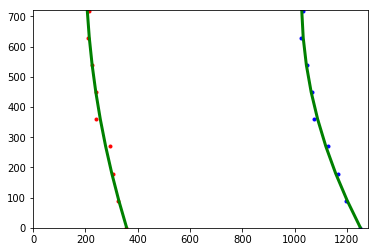

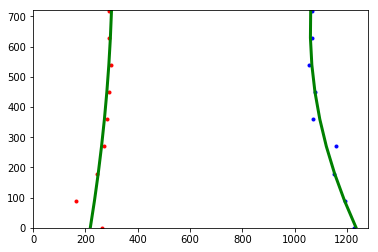

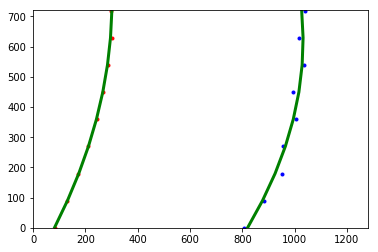

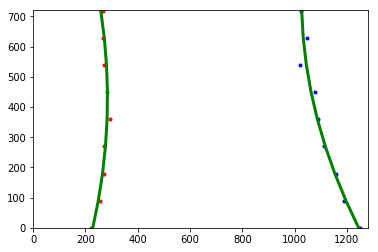

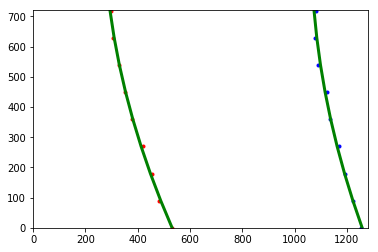

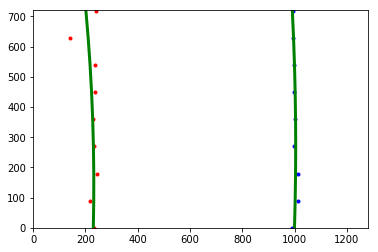

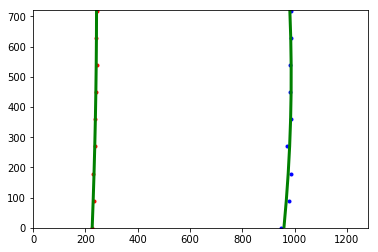

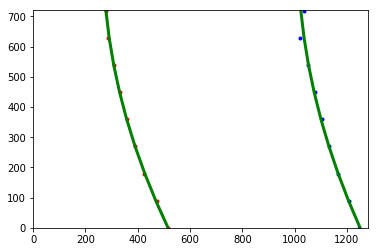

In [12]:
positions = []
centers = []
left_fitxs = []
right_fitxs = []
left_curverads = []
right_curverads = []

for i in range(len(warped_images)):    
    position, center, leftx, rightx, left_fitx, right_fitx, left_curverad, right_curverad = curvature(leftxs[i], rightxs[i])
    positions.append(position)
    centers.append(center)
    leftxs[i] = leftx
    rightxs[i] = rightx
    left_fitxs.append(left_fitx)
    right_fitxs.append(right_fitx)
    left_curverads.append(left_curverad)
    right_curverads.append(right_curverad)
    # Plot up the data
    mark_size = 3
    plt.figure()
    plt.plot(leftxs[i], ploty, 'o', color='red', markersize=mark_size)
    plt.plot(rightxs[i], ploty, 'o', color='blue', markersize=mark_size)
    plt.xlim(0, 1280)
    plt.ylim(0, 720)
    plt.plot(left_fitx, ploty, color='green', linewidth=3)
    plt.plot(right_fitx, ploty, color='green', linewidth=3)
    file_name = "output_images/curverads" + str(i + 1) + ".png"
    plt.savefig(file_name)
    # Now our radius of curvature is in meters
    print('Left:',left_curverad, 'm - Right:', right_curverad, 'm')
#     f, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(10,5))
#     f.tight_layout()
#     ax1.imshow(test_images[i])
#     ax1.set_title('Original Image', fontsize=12)
#     ax2.imshow(unsdistorted_images[i], cmap='gray')
#     ax2.set_title('Undistorted Image', fontsize=12)
#     ax3.imshow(binary_images[i], cmap='gray')
#     ax3.set_title('Binary Image', fontsize=12)
#     ax4.imshow(warped_images[i], cmap='gray')
#     ax4.set_title('Top down Image', fontsize=12)
#     ax5.imshow(outputs[i], cmap='gray')
#     ax5.set_title('Fitted Image', fontsize=12)
# #     ax6.set_size_inches(10,5)
#     ax6.plot(leftxs[i], ploty, 'o', color='red')
#     ax6.plot(rightxs[i], ploty, 'o', color='blue')
#     ax6.set_xlim(0, 1280)
#     ax6.set_ylim(0, 720)
#     ax6.plot(left_fitx, ploty, color='green', linewidth=3)
#     ax6.plot(right_fitx, ploty, color='green', linewidth=3)
# #     ax6.gca().invert_yaxis()
#     plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.) 
    

In [13]:
def warpBack(image, warp, persp_M, le_fitx, ri_fitx):
    Minv = np.linalg.inv(persp_M)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warp).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([le_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([ri_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255,255))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    return result

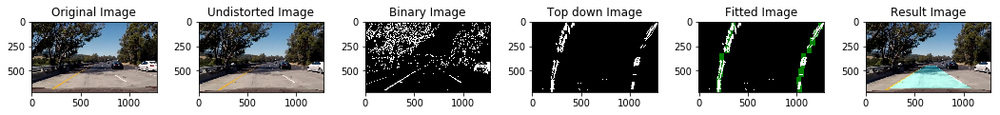

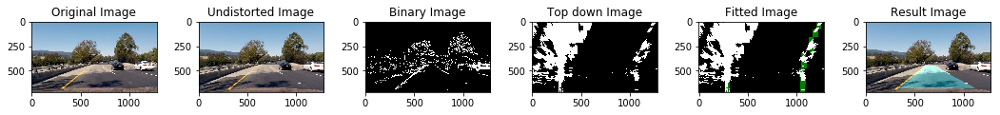

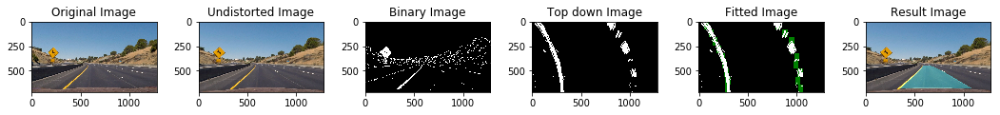

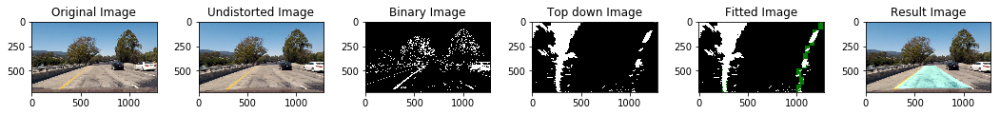

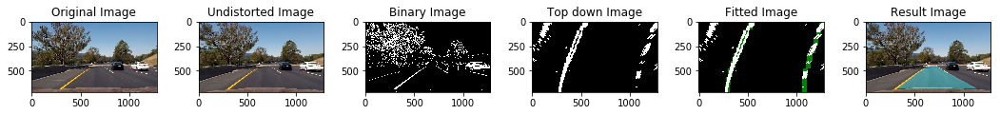

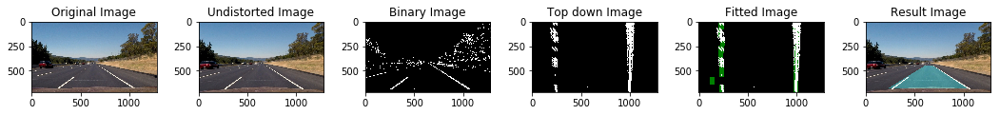

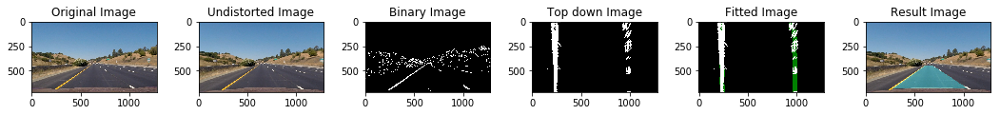

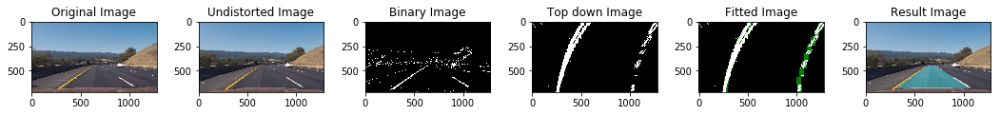

In [14]:
result_images = []

for i in range(len(warped_images)):
    result_image = warpBack(unsdistorted_images[i], warped_images[i], perspective_Ms[i], left_fitxs[i], right_fitxs[i])
    result_images.append(result_image)

# Plot the result
for i in range(len(result_images)):
    f, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(14,7))
    f.tight_layout()
    ax1.imshow(test_images[i])
    ax1.set_title('Original Image', fontsize=12)
    ax2.imshow(unsdistorted_images[i], cmap='gray')
    ax2.set_title('Undistorted Image', fontsize=12)
    ax3.imshow(binary_images[i], cmap='gray')
    ax3.set_title('Binary Image', fontsize=12)
    ax4.imshow(warped_images[i], cmap='gray')
    ax4.set_title('Top down Image', fontsize=12)
    ax5.imshow(outputs[i], cmap='gray')
    ax5.set_title('Fitted Image', fontsize=12)
    ax6.imshow(result_images[i])
    ax6.set_title('Result Image', fontsize=12)
    f.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    file_name = "output_images/step_by_step" + str(i + 1) + ".png"
    f.savefig(file_name)

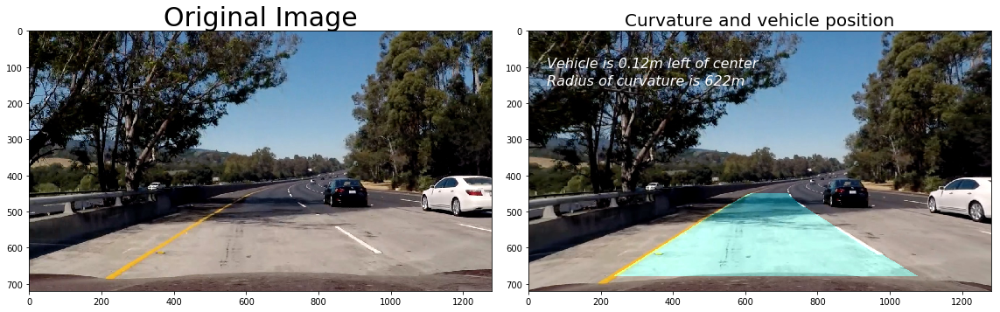

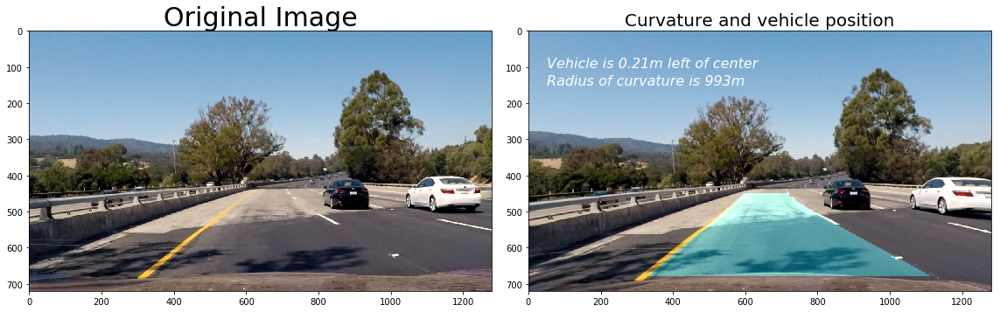

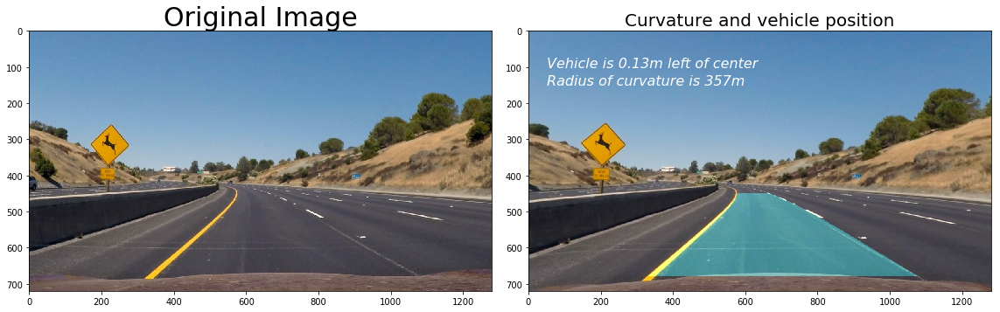

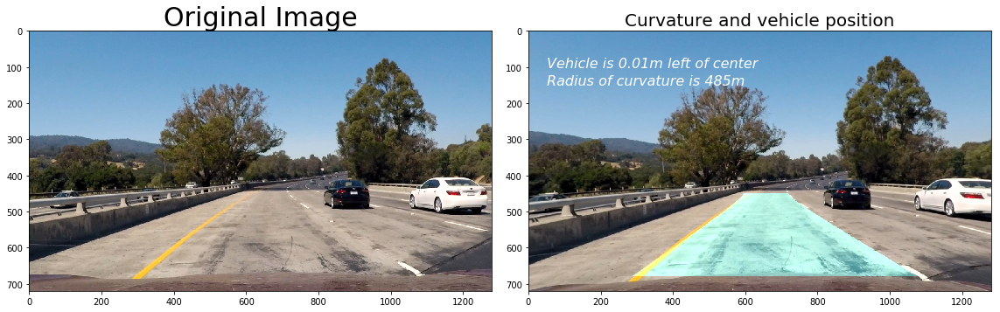

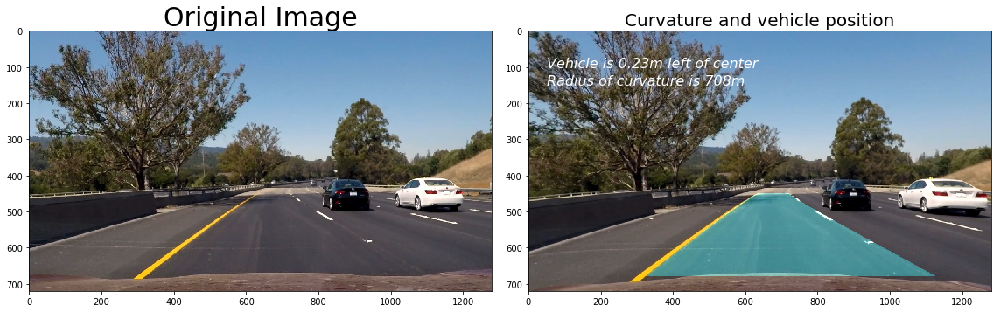

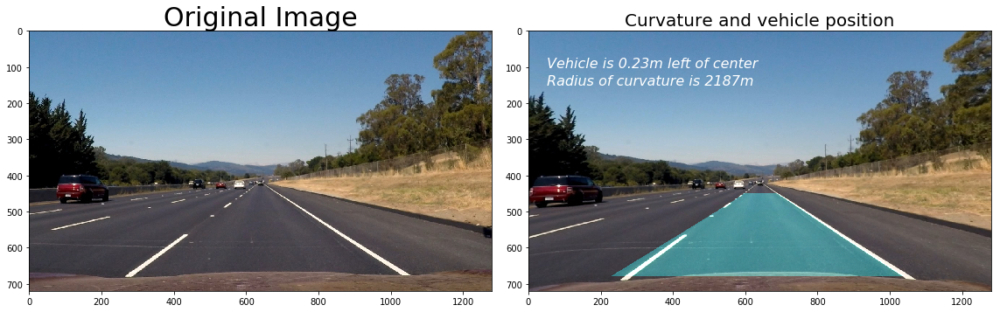

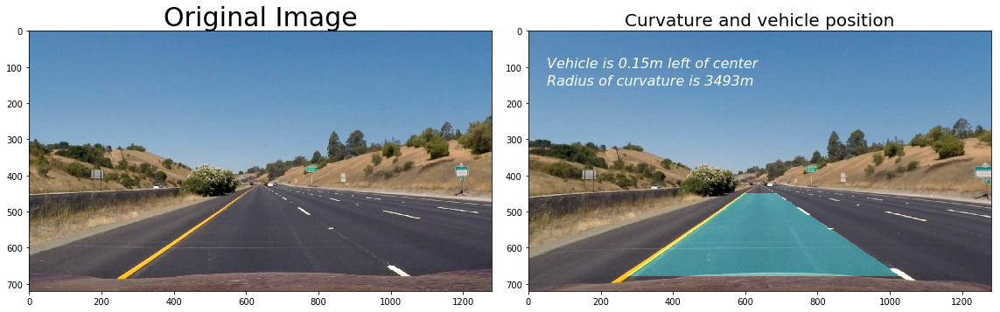

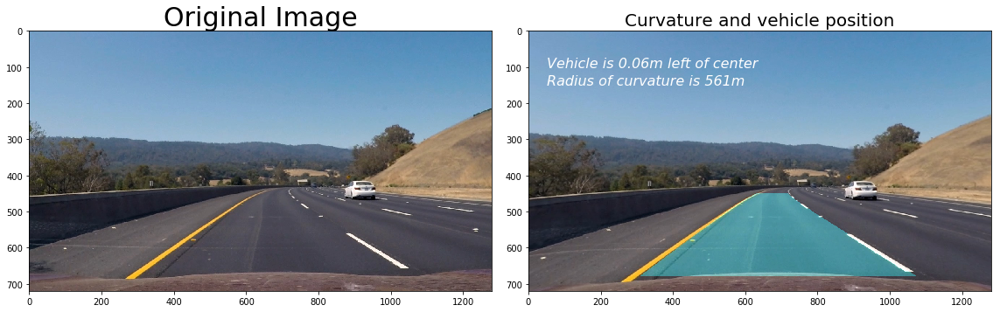

In [15]:
   
for i in range(len(result_images)):   
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
    f.tight_layout()
    
    ax1.set_title("Original Image", fontsize=30)
    ax1.imshow(test_images[i])
    
    ax2.set_title("Curvature and vehicle position", fontsize=20)
    if position == 640:
        ax2.text(50, 100, 'Vehicle is in the center', style='italic', color='white', fontsize=16)
    elif position < 640:
        ax2.text(50, 100, 'Vehicle is {:.2f}m left of center'.format(centers[i]*3.7/700),
             style='italic', color='white', fontsize=16)
    else:
        ax2.text(50, 100, 'Vehicle is {:.2f}m right of center'.format(centers[i]*3.7/700),
             style='italic', color='white', fontsize=16)
    
    ax2.text(50, 150, 'Radius of curvature is {}m'.format(int((left_curverads[i] + right_curverads[i])/2)), 
             style='italic', color='white', fontsize=16)    
    ax2.imshow(result_images[i])


In [16]:
# define the Line class
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

### Pipeline

In [17]:
# the final whole pipeline
def pipeline(image):  
    undistorded = undistor(image)
    final_binary = toBinary(undistorded)
    final_warped, final_perspective_M = warper(final_binary)
    window_cent, lex, rix = find_window_centroids(final_warped, window_width, window_height, margin)      
    position, center, leftx, rightx, left_lane.recent_xfitted, right_lane.recent_xfitted, left_lane.radius_of_curvature, right_lane.radius_of_curvature = curvature(lex, rix)

    alpha = 0.5
    if left_lane.bestx == None:
        left_lane.bestx = left_lane.recent_xfitted
    else :    
        left_lane.recent_xfitted = left_lane.recent_xfitted * ( 1 - alpha) + alpha * left_lane.bestx
        
    if right_lane.bestx == None:
        right_lane.bestx = right_lane.recent_xfitted
    else :    
        right_lane.recent_xfitted = right_lane.recent_xfitted * ( 1 - alpha) + alpha * right_lane.bestx  
            
    #Sanity check  
    left_lane.detected = False
    right_lane.detected = False 
    
    max_distance = 0  
    min_distance = 10000
    for i in range(len(left_lane.recent_xfitted)) : 
        point_distance = right_lane.recent_xfitted[i] - left_lane.recent_xfitted[i]
        if point_distance > max_distance:
            max_distance = point_distance
        if point_distance < min_distance:
            min_distance = point_distance    
        
    if (min_distance > 710) and (max_distance < 900):
        left_lane.detected = True
        right_lane.detected = True              
        
    if not left_lane.detected:
        left_lane.recent_xfitted = left_lane.bestx
    else:
        left_lane.bestx = left_lane.recent_xfitted
    if not right_lane.detected:
        right_lane.recent_xfitted = right_lane.bestx
    else:
        right_lane.bestx = right_lane.recent_xfitted
    
    result = warpBack(image, final_warped, final_perspective_M, left_lane.recent_xfitted, right_lane.recent_xfitted)    
    
    # Print distance from center on video
    if (center*3.7/700) < 0.01:
        cv2.putText(result, 'Vehicle is in the center', (50,80),
                 fontFace = 16, fontScale = 1, color=(255,255,255), thickness = 1)
    elif center < 640:
        cv2.putText(result, 'Vehicle is {:.2f}m left of center'.format(center*3.7/700), (50,80),
                 fontFace = 16, fontScale = 1, color=(255,255,255), thickness = 1)
    else:
        cv2.putText(result, 'Vehicle is {:.2f}m right of center'.format(center*3.7/700), (50,80),
                 fontFace = 16, fontScale = 1, color=(255,255,255), thickness = 1)
    # Print radius of curvature on video
    cv2.putText(result, 'Radius of Curvature {}(m)'.format(int((left_lane.radius_of_curvature + right_lane.radius_of_curvature)/2)), (50,140),
             fontFace = 16, fontScale = 1, color=(255,255,255), thickness = 1)
    
    return result

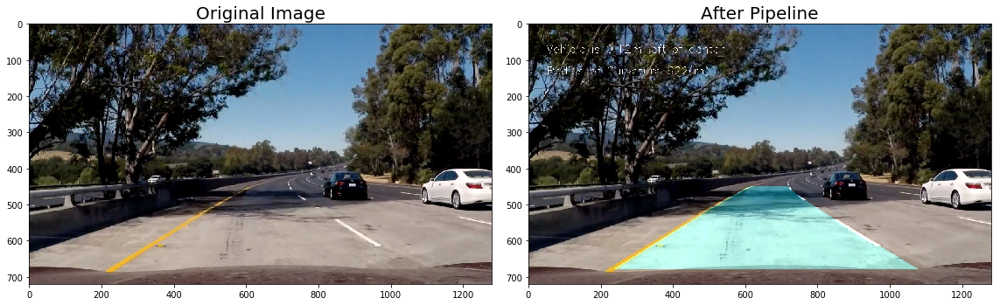

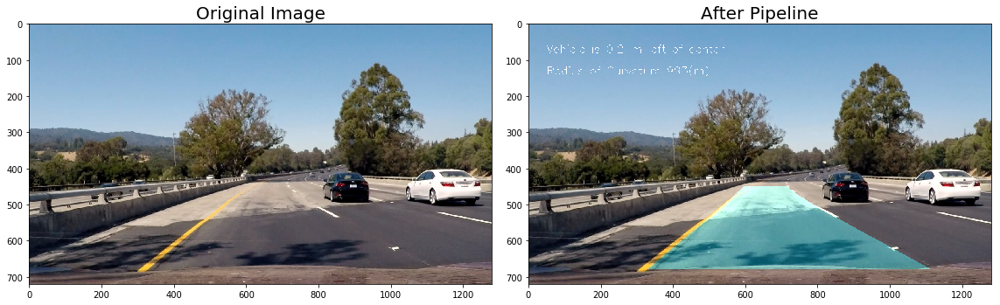

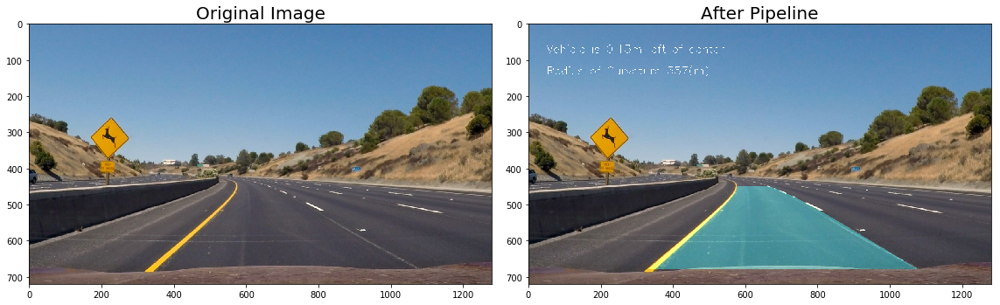

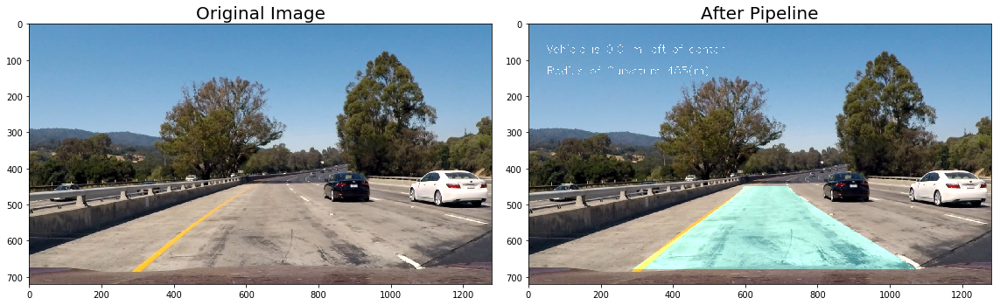

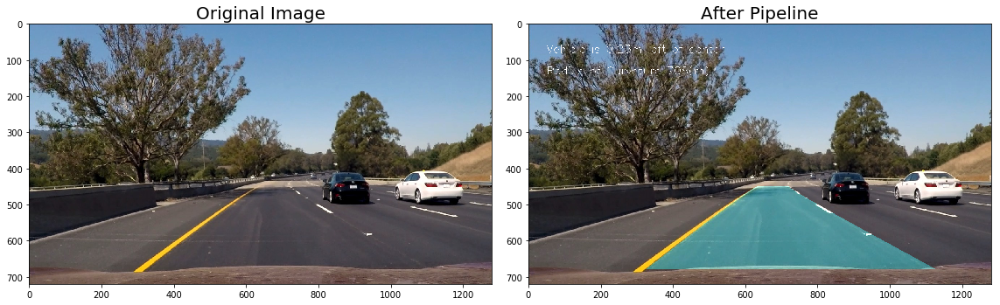

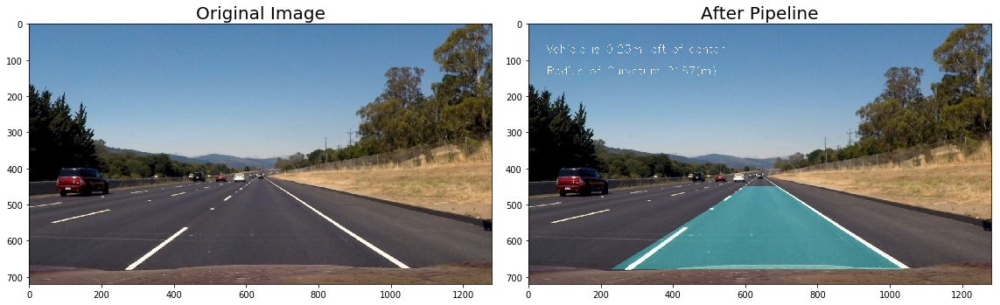

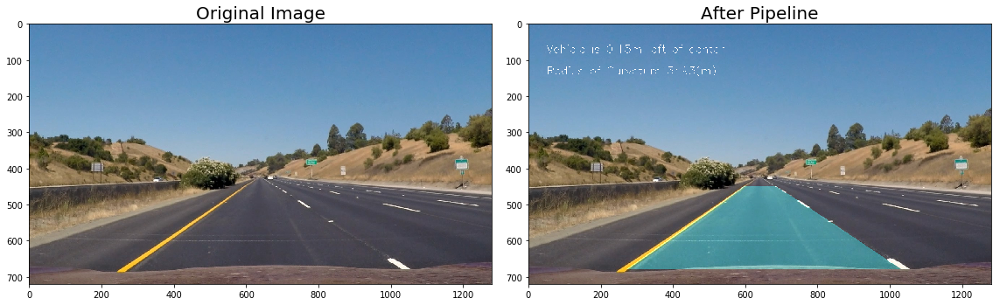

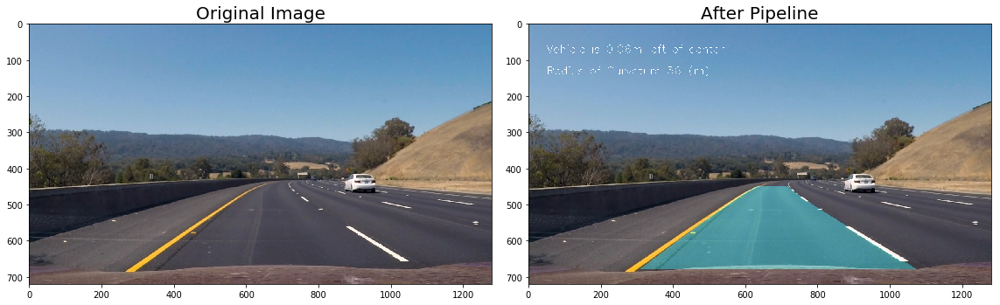

In [18]:
# Test Final Pipeline
for i in range(len(test_images)):
    left_lane = Line()
    right_lane = Line()
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
    f.tight_layout()
    ax1.set_title("Original Image", fontsize=20)
    ax1.imshow(test_images[i])
    ax2.set_title("After Pipeline", fontsize=20)
    ax2.imshow(pipeline(test_images[i]))
    file_name = "output_images/pipeline" + str(i + 1) + ".png"
    f.savefig(file_name)

### Apply pipeline to the vieo

In [ ]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

left_lane = Line()
right_lane = Line()
white_output = 'project_video_result.mp4'
clip1 = VideoFileClip("./project_video.mp4")#.subclip(38,43)
white_clip = clip1.fl_image(pipeline)
%time white_clip.write_videofile(white_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

[MoviePy] >>>> Building video project_video_result.mp4
[MoviePy] Writing video project_video_result.mp4


 56%|█████▋    | 711/1261 [02:34<01:52,  4.91it/s]

In [ ]:
pipeline_exmaple = [test_images[5] ,unsdistorted_images[5] ,binary_images[5] ,warped_images[5] ,outputs[5] ,result_images[5]]
pipeline_step = ['Original Image', 'Undistorted Image', 'Binary Image', 'Top down Image', 'Fitted Image', 'Result Image']
for i in range(1, len(pipeline_step)):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
    f.tight_layout()
    ax1.set_title(pipeline_step[i - 1], fontsize=20)
    ax1.imshow(pipeline_exmaple[i - 1])
    ax2.set_title(pipeline_step[i], fontsize=20)
    ax2.imshow(pipeline_exmaple[i])
    file_name = "output_images/step" + str(i) + ".png"
    f.savefig(file_name)    
